## Subsample instances from Arnolds benchmark

In [49]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [50]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from lib.problem.sampling_utils import sub_sample
from lib.problem import RPGenerator, RPInstance


In [51]:
PROBLEM = "CVRP"
SEED = 333
SIZE = 50
GS = 2000
ROOT_SV_PTH = f"data/CVRP/real{GS}/"
FNAME = f"data_test_seed{SEED}_size{SIZE}_arnold_square-rnd.dat"
INST_DIR = f"data/CVRP/benchmark/arnold/"
# instances with >= 10,000 customers
# the number of samples is simply floor(num_customers/2000)
# leading to exactly 50 instances
INST_NAME_SAMPLES = {
    "Brussels1.vrp": 7,     # floor(15,000/2000)
    "Brussels2.vrp": 8,     # floor(16,000/2000)
    "Flanders1.vrp": 10,    # floor(20,000/2000)
    "Flanders2.vrp": 15,    # floor(30,000/2000)
    "Ghent1.vrp": 5,        # floor(10,000/2000)
    "Ghent2.vrp": 5,        # floor(11,000/2000)
}

os.makedirs(ROOT_SV_PTH, exist_ok=True)
save_pth = os.path.join(ROOT_SV_PTH, FNAME)

In [52]:
instances = []
for fname, n_samp in INST_NAME_SAMPLES.items():
    pth = os.path.join(INST_DIR, fname)
    data = RPGenerator.load_dataset(pth)
    inst = data[0]
    xyw = np.concatenate((inst.coords, inst.demands[:, None]), axis=-1)
    rng = np.random.RandomState(SEED)
    samples = sub_sample(
        xyw,
        size=n_samp,
        n=GS,
        rng=rng,
        method="quadrant_rnd",
        weight_factor=1.0,
        add_depot=True
    )
    instances += [RPInstance(
        coords=s[:, :2],
        demands=s[:, -1],
        graph_size=GS+1,     # + depot!
        vehicle_capacity=1.0,   # is normalized
    ) for s in samples]

RPGenerator.save_dataset(instances, filepath=save_pth)


Dataset file with same name exists already. Overwrite file? (y/n)


'data/CVRP/real2000/data_test_seed333_size50_arnold_square-rnd.dat'

50
[RPInstance( coords=ndarray_[2001, 2],  demands=ndarray_[2001],  graph_size=2001,  depot_idx=[0],  vehicle_capacity=1.0,  max_num_vehicles=None,  time_windows=None), RPInstance( coords=ndarray_[2001, 2],  demands=ndarray_[2001],  graph_size=2001,  depot_idx=[0],  vehicle_capacity=1.0,  max_num_vehicles=None,  time_windows=None), RPInstance( coords=ndarray_[2001, 2],  demands=ndarray_[2001],  graph_size=2001,  depot_idx=[0],  vehicle_capacity=1.0,  max_num_vehicles=None,  time_windows=None), RPInstance( coords=ndarray_[2001, 2],  demands=ndarray_[2001],  graph_size=2001,  depot_idx=[0],  vehicle_capacity=1.0,  max_num_vehicles=None,  time_windows=None), RPInstance( coords=ndarray_[2001, 2],  demands=ndarray_[2001],  graph_size=2001,  depot_idx=[0],  vehicle_capacity=1.0,  max_num_vehicles=None,  time_windows=None), RPInstance( coords=ndarray_[2001, 2],  demands=ndarray_[2001],  graph_size=2001,  depot_idx=[0],  vehicle_capacity=1.0,  max_num_vehicles=None,  time_windows=None), RPInst

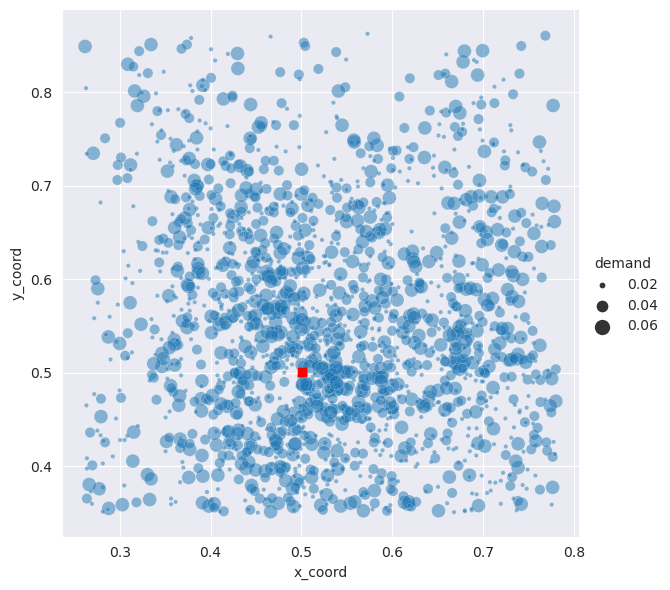

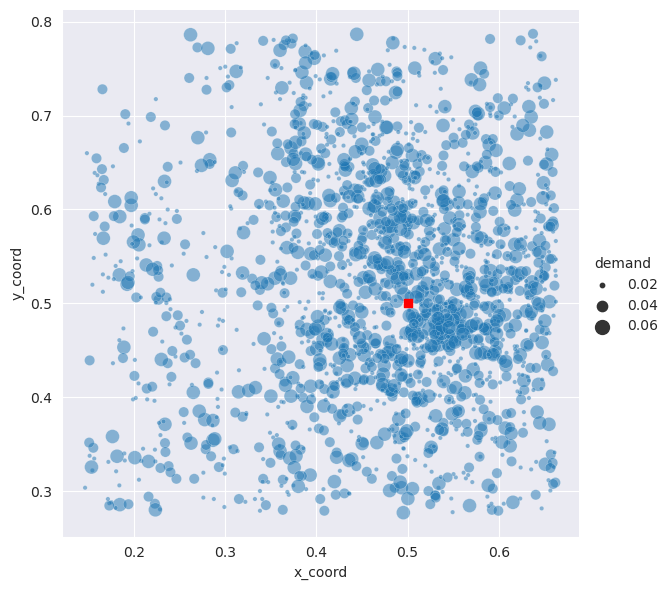

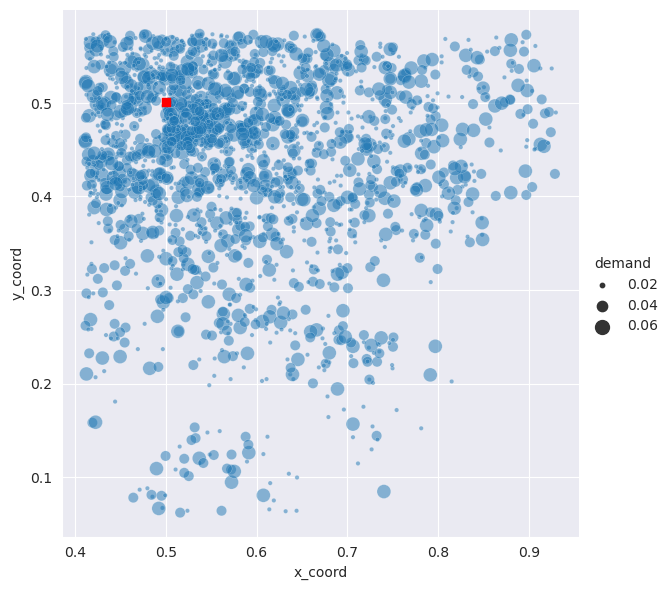

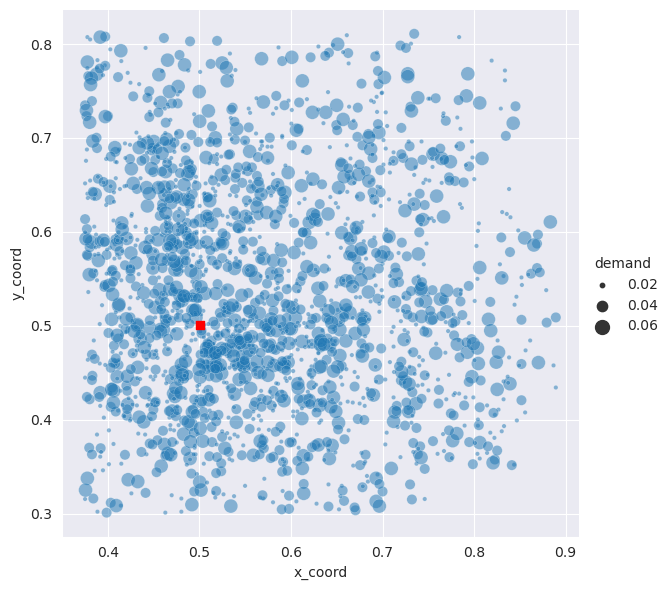

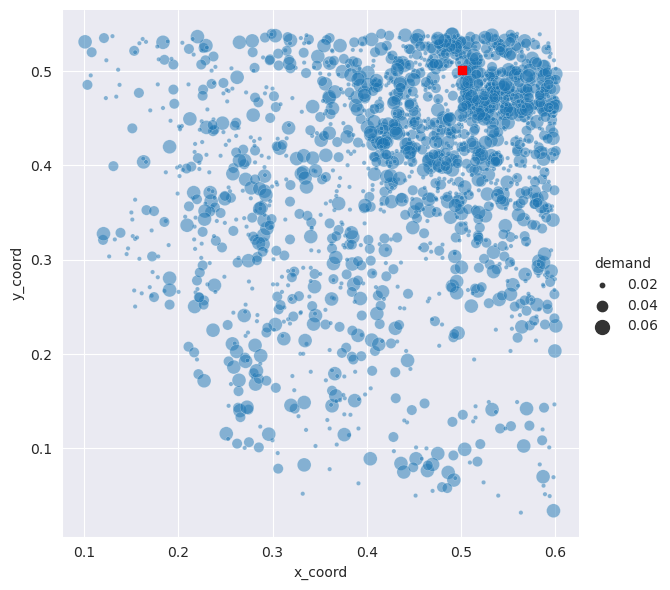

...

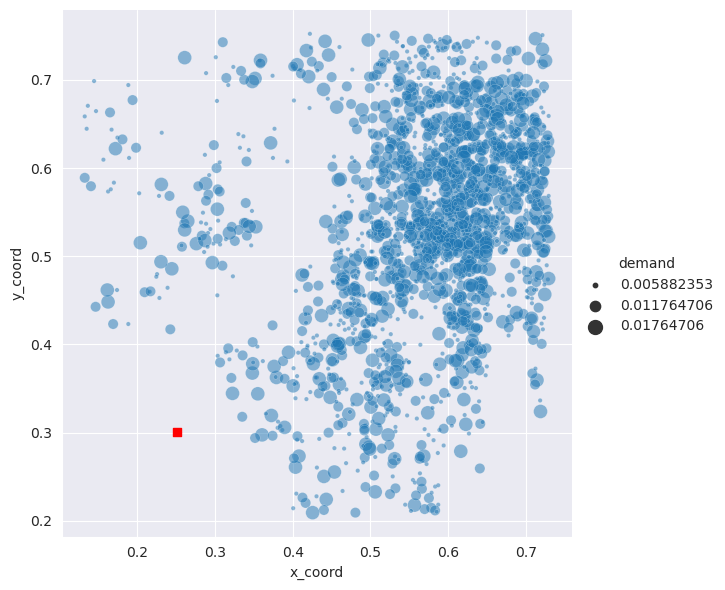

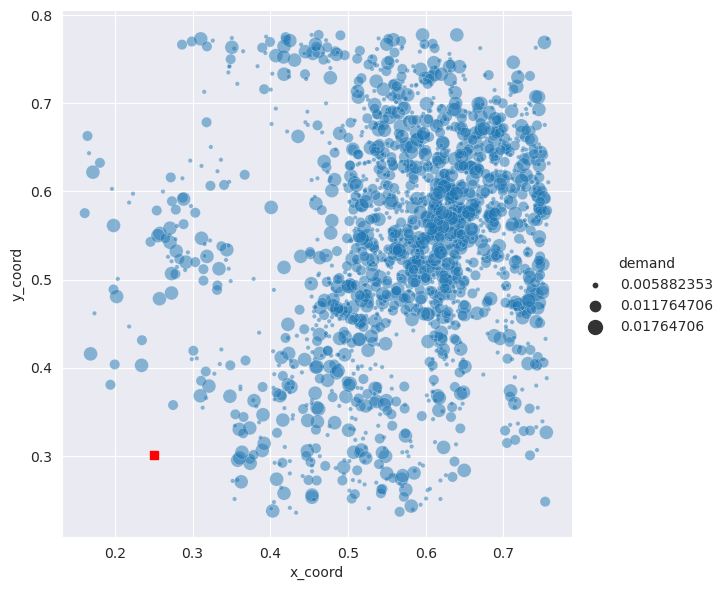

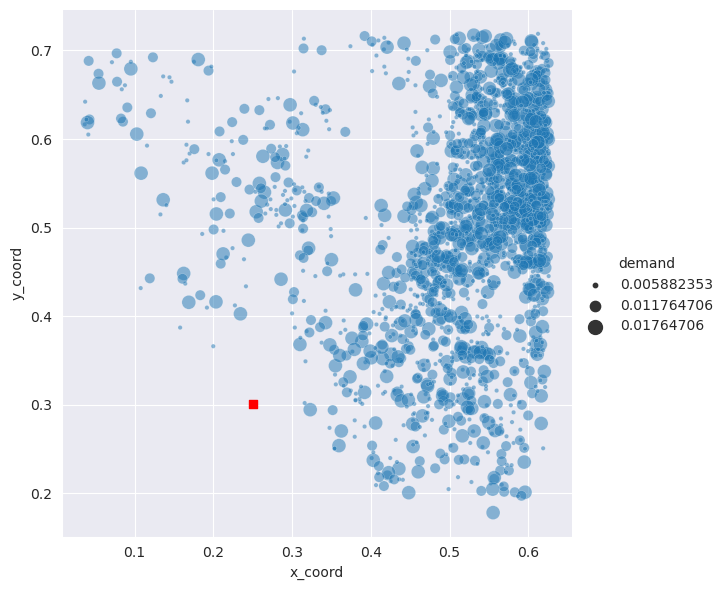

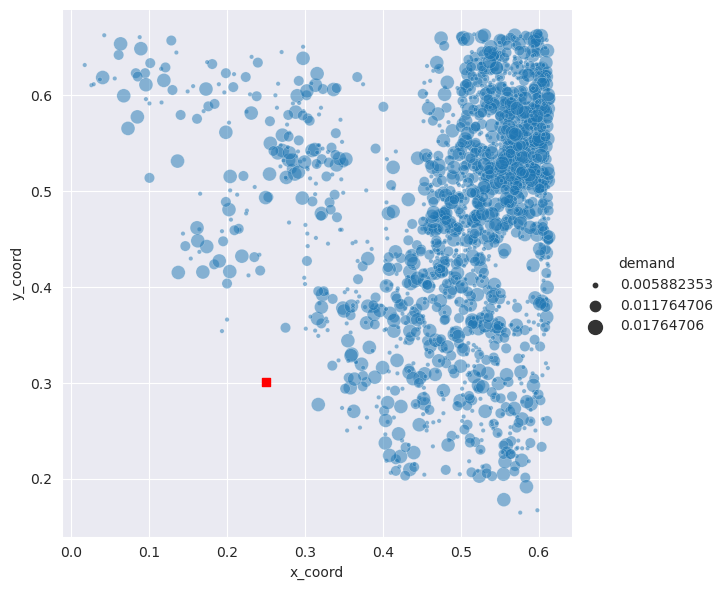

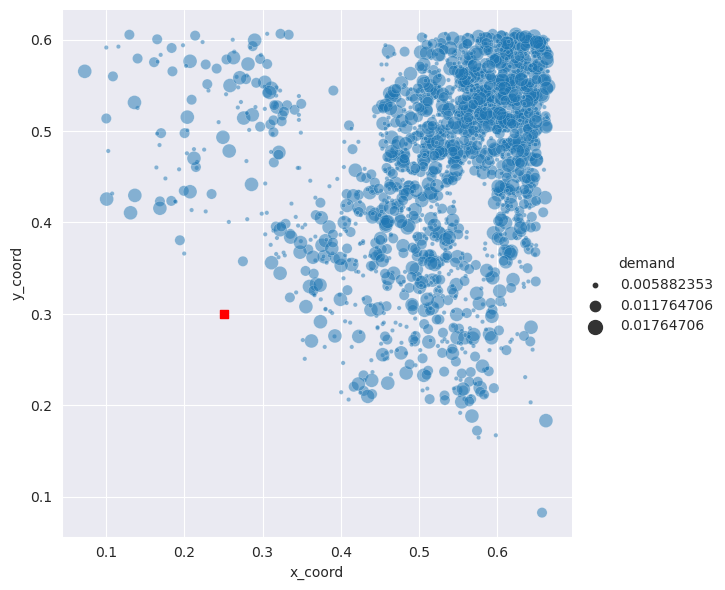

In [53]:
print(len(instances))
print(instances)

COLS = ["x_coord", "y_coord", "demand"]
for inst in instances:
    dt = np.concatenate((inst.coords, inst.demands[:, None]), axis=-1)
    df_ = pd.DataFrame(data=dt, columns=COLS)
    sns.relplot(x="x_coord", y="y_coord", size="demand",
                sizes=(10, 100), alpha=.5, #palette="muted",
                height=6, data=df_.iloc[1:])
    dep = df_.iloc[0].to_numpy()
    plt.scatter(dep[0], dep[1], marker="s", c="red")
    plt.show()